# Problem Statement
---
The goal is to develop an chatbot capable of providing detailed responses about fashion products from a dataset obtained from Myntra. This chatbot must effectively understand user queries, retrieve relevant product information, and generate comprehensive explanations. The solution involves preprocessing the dataset, creating a vector-based index for efficient querying, and implementing Retrieval-Augmented Generation (RAG) using LlamaIndex to generate detailed responses. The chatbot should also manage conversational context and memory across interactions.

# Why LlamaIndex?
---
LlamaIndex is an ideal framework for this project because it provides robust tools for creating vector-based search indices and implementing Retrieval-Augmented Generation. It supports efficient querying and retrieval of documents, which is crucial for generating detailed and contextually relevant responses by combining retrieval with generated content.

# System Design

---
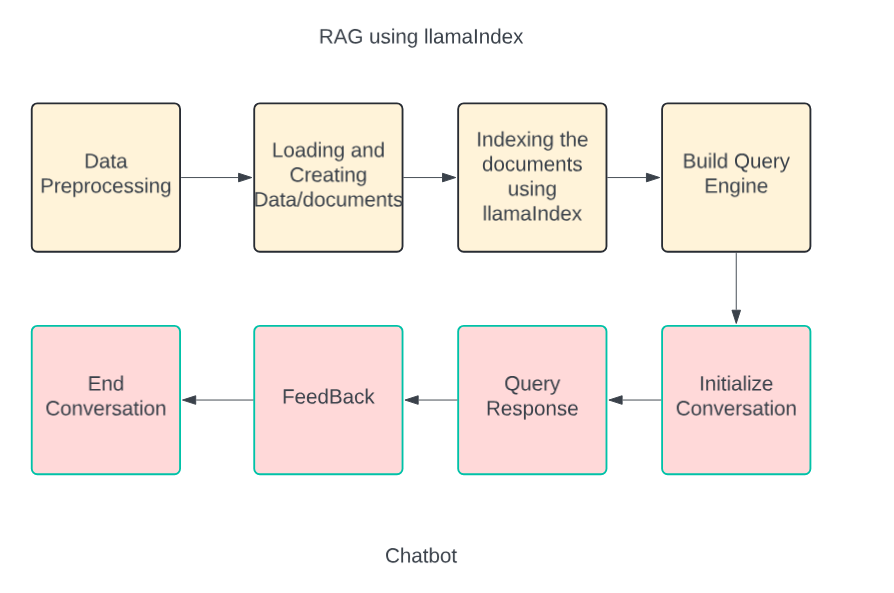


# Stage1: Install required Libraries

In [1]:
!pip install llama-index langchain openai pandas -q
!pip install --upgrade llama-index

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 999.6 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.5/15.5 MB 58.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 990.3/990.3 kB 36.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 337.0/337.0 kB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 377.3/377.3 kB 21.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.9/139.9 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 54.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.1/141.1 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.8/295.8 kB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
# importing the required libraries
import openai
import re
import pandas as pd
from llama_index.core.node_parser import SimpleNodeParser
from llama_index.core import VectorStoreIndex
from llama_index.core import SimpleDirectoryReader

In [3]:
# Mount the drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [4]:
# Set the API key
filepath = "/content/drive/MyDrive/"
with open(filepath + "OpenAI_API_Key.txt", "r") as f:
    openai.api_key = ' '.join(f.readlines())

# Stage2: Data Processing

In [5]:
# Load dataset
df = pd.read_csv('/content/drive/MyDrive/Gen_AI_Upgrad/RELvogue/fashion_dataset.csv')

In [6]:
# inspecting the dataset
df.head()

,p_id,name,products,price,colour,brand,img,ratingCount,avg_rating,description,p_attributes
0,17048614,Khushal K Women Black Ethnic Motifs Printed Ku...,"Kurta, Palazzos, Dupatta",5099.0,Black,Khushal K,http://assets.myntassets.com/assets/images/170...,4522.0,4.418399,black printed kurta with palazzos with dupatta...,addons na body shape id 443333324424 body or g...
1,16524740,InWeave Women Orange Solid Kurta with Palazzos...,"Kurta, Palazzos, Floral Print Dupatta",5899.0,Orange,InWeave,http://assets.myntassets.com/assets/images/165...,1081.0,4.119334,orange solid kurta with palazzos with dupattak...,addons na body shape id 443333324424 body or g...
2,16331376,Anubhutee Women Navy Blue Ethnic Motifs Embroi...,"Kurta, Trousers, Dupatta",4899.0,Navy Blue,Anubhutee,http://assets.myntassets.com/assets/images/163...,1752.0,4.161530,navy blue embroidered kurta with trousers with...,addons na body shape id 333424 body or garment...
3,14709966,Nayo Women Red Floral Printed Kurta With Trous...,"Kurta, Trouser, Dupatta",3699.0,Red,Nayo,http://assets.myntassets.com/assets/images/147...,4113.0,4.088986,red printed kurta with trouser and dupattakurt...,addons na body shape id 333424 body or garment...
4,11056154,AHIKA Women Black & Green Printed Straight Kurta,Kurta,1350.0,Black,AHIKA,http://assets.myntassets.com/assets/images/110...,21274.0,3.978377,black and green printed straight kurta has a n...,body shape id 424 body or garment size garment...


In [7]:
# Fill missing values
df['ratingCount'].fillna(df['ratingCount'].mean(), inplace=True)
df['avg_rating'].fillna(df['avg_rating'].mean(), inplace=True)

In [8]:
# Preprocessing text
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'<.*?>', '', text)  # Remove HTML tags
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    text = re.sub(r'\s+', ' ', text).strip()  # Remove extra spaces
    return text

In [9]:
df['description'] = df['description'].apply(preprocess_text)
df['p_attributes'] = df['p_attributes'].apply(preprocess_text)

In [10]:
# Updating the changes in the csv file
df.to_csv('/content/drive/MyDrive/Gen_AI_Upgrad/RELvogue/fashion_dataset.csv', index=False)

# Stage3: Load the data and prepare the data or documents for search system

In [11]:
# SimpleDirectoryReader from LlamaIndex
reader = SimpleDirectoryReader(input_files=['/content/drive/MyDrive/Gen_AI_Upgrad/RELvogue/fashion_dataset.csv'])

In [12]:
# Loading the data
documents = reader.load_data()

In [13]:
documents

[Document(id_='ec80937c-cc77-4514-a785-fcc8b58567bb', embedding=None, metadata={'file_path': '/content/drive/MyDrive/Gen_AI_Upgrad/RELvogue/fashion_dataset.csv', 'file_name': 'fashion_dataset.csv', 'file_type': 'text/csv', 'file_size': 13875676, 'creation_date': '2024-07-30', 'last_modified_date': '2024-07-30'}, excluded_embed_metadata_keys=['file_name', 'file_type', 'file_size', 'creation_date', 'last_modified_date', 'last_accessed_date'], excluded_llm_metadata_keys=['file_name', 'file_type', 'file_size', 'creation_date', 'last_modified_date', 'last_accessed_date'], relationships={}, text="17048614, Khushal K Women Black Ethnic Motifs Printed Kurta with Palazzos & With Dupatta, Kurta, Palazzos, Dupatta, 5099.0, Black, Khushal K, http://assets.myntassets.com/assets/images/17048614/2022/2/4/b0eb9426-adf2-4802-a6b3-5dbacbc5f2511643971561167KhushalKWomenBlackEthnicMotifsAngrakhaBeadsandStonesKurtawit7.jpg, 4522.0, 4.4183989385227775, black printed kurta with palazzos with dupatta kurta de

# Stage4: Indexing

In [14]:
# Create parser and parse document into nodes
parser = SimpleNodeParser.from_defaults()
nodes = parser.get_nodes_from_documents(documents)

In [15]:
# Initialize LlamaIndex
index = VectorStoreIndex(nodes)

# Stage5: Constructing Query Engine

In [16]:
# Construct Query Engine
query_engine = index.as_query_engine()

# Stage6: Chatbot

## Setting conversation_memory and chat completions

In [34]:
# Initialize the conversation memory
conversation_memory = []

In [18]:
def chatcompletions(conversation_history, user_input):
    # Construct the messages list with the conversation history
    messages = [
        {"role": "system", "content": f"You are a fashion expert. You are required to give very detailed explanation of the topmost product in the following: {user_input}. Provide a relevant response."}
    ]
    if conversation_history:
        for entry in conversation_history:
            messages.append({"role": "user", "content": entry["User"]})
            messages.append({"role": "assistant", "content": entry["Bot"]})

    response = openai.chat.completions.create(
        model="gpt-3.5-turbo",
        messages=messages,
        max_tokens=1000,
        temperature=0
    )
    return response.choices[0].message.content

## Query_response function to get the response for the user query.

In [19]:
def query_response(user_input):
    global conversation_memory
    # Assuming query_engine.query(user_input) gives a response object with response and source_nodes attributes
    response = query_engine.query(user_input)
    metadata = response.source_nodes[0].node.get_text()

    # Generate a detailed explanation with memory
    detailed_response = chatcompletions(conversation_memory, metadata)
    final_response = response.response + '\n\nCheck further detail of the products:\n\n' + detailed_response

    # Store the user input and bot response in the conversation memory
    conversation_memory.append({"User": user_input, "Bot": final_response})

    return final_response

## A testing Pipeline to Check the working of chatbot

In [20]:
def testing_pipeline(questions):
    test_feedback = []
    for question in questions[:len(questions)-1]:
        print(f"\nUser: {question}")
        user_feedback = input("\nPlease provide your feedback on the response provided by the bot (Good/Bad): ")
        test_feedback.append((question, user_feedback))
    feedback_df = pd.DataFrame(test_feedback, columns=['Question', 'Good or Bad'])
    return feedback_df

## A function to set the conversation

In [21]:
def initialize_conv():
    global conversation_memory
    feedback_list = []
    print('Feel free to ask questions regarding the fashion products. Type "exit" once you are done.')

    while True:
        print("\n")
        user_input = input("User: ")
        feedback_list.append(user_input)
        if user_input.lower() == 'exit':
            feedback_choice = input("\nWould you like to provide feedback? (yes/no): ").strip().lower()
            if feedback_choice == 'yes':
                feedback_df = testing_pipeline(feedback_list)
                display(feedback_df)
                print("\nThank you for your feedback!. Have a nice day!")
            else:
                print("\nThank you for using the chatbot. Have a nice day!")

            # # Print the conversation memory
            # print("\nConversation Memory:")
            # for entry in conversation_memory:
            #     print(f"User: {entry['User']}")
            #     print(f"Bot: {entry['Bot']}")
            break
        else:
            if conversation_memory:
                print("\n",chatcompletions(conversation_memory, user_input))
            else:
              response = query_response(user_input)
              print("\n",response)

## Dialogue Management

In [35]:
def Dialogue_Management():
    global conversation_memory
    conversation_memory = []
    initialize_conv()

# Evaluation

## Test Case 1:

In [25]:
# Conversation 1
Dialogue_Management()

Feel free to ask questions regarding the fashion products. Type "exit" once you are done.


User: Are there any black kurtas available.

 If you are interested in a black kurta, the HERE&NOW Grey & Black Ethnic Motifs Printed Pure Cotton Kurti mentioned above could be a great option for you. It features a stylish black color with ethnic motifs printed all over, giving it a traditional yet trendy look. The pure cotton fabric ensures comfort and breathability, making it suitable for daily wear.

The kurti is designed in an A-line silhouette with a round neck and three-quarter regular sleeves, providing a flattering fit. It does not have any pockets and features side slits for added comfort and movement. The sustainable piece is made from regular techniques and can be easily cared for by machine washing.

Overall, this black printed kurti is a versatile and fashionable choice that combines traditional elements with a modern aesthetic.


User: What is the price of this kurta?

 The price o

,Question,Good or Bad
0,Are there any black kurtas available.,Good
1,What is the price of this kurta?,Good
2,Is it suitable for festive wear?,Good



Thank you for your feedback!. Have a nice day!


## Test Case 2:

In [29]:
# Conversation 2
Dialogue_Management()

Feel free to ask questions regarding the fashion products. Type "exit" once you are done.


User: I'm looking for something to wear for a festival.

 You might want to consider a clothing set that consists of a top and trousers in navy blue and peach colors. It features a round neck, short layered sleeves, and a button closure. This outfit is suitable for a festival and can be styled to create a trendy and fashionable look.

Check further detail of the products:

The "Inddus Women Gorgeous Green Printed Top with Solid Skirt" is a stunning and stylish clothing set that will make you stand out in any event. 

Top:
The top features a gorgeous green shade with a printed design that adds a trendy and fashionable touch to the outfit. It has three-quarter sleeves and a mandarin collar, giving it a unique and elegant look. The bell sleeves are fitted from the shoulder to the elbow and gently flared from the elbow onwards, providing a trendy and feminine silhouette. The wide openings of the bel

# Test Case 3:

In [36]:
Dialogue_Management()

Feel free to ask questions regarding the fashion products. Type "exit" once you are done.


User: I want something with golden vibes.



 Mitera Purple & Golden Ethnic Motifs Zari Woven Design Paithani Saree

Check further detail of the products:

The Soch Brown & Gold-Toned Embellished Beads and Stones Silk Blend Saree is a stunning piece that exudes elegance and sophistication. 

Design Details:
This saree features a beautiful combination of brown and gold tones, creating a rich and luxurious look. The saree is embellished with intricate beads and stones, adding a touch of glamour to the overall design. The embellishments are prominently featured on the border of the saree, enhancing its beauty.

Fabric and Care:
Made from a silk blend, this saree is not only luxurious to the touch but also drapes beautifully. To maintain its quality, it is recommended to dry clean the saree. The length of the saree is 5.5 meters, and it comes with an additional 0.8-meter blouse piece. The width of the saree is approximately 1.06 meters.

Blouse Details:
The saree comes with an unstitched blouse piece, allowing you to customize it to